In [ ]:
!pip install kaggle -q
!kaggle datasets download -d muhammad0subhan/fruit-and-vegetable-disease-healthy-vs-rotten
!unzip -q fruit-and-vegetable-disease-healthy-vs-rotten.zip -d .
!ls "Fruit And Vegetable Disease" | head -5

Dataset URL: https://www.kaggle.com/datasets/muhammad0subhan/fruit-and-vegetable-disease-healthy-vs-rotten
License(s): CC0-1.0
100% 4.77G/4.77G [00:48<00:00, 106MB/s]

ls: cannot access 'Fruit And Vegetable Disease': No such file or directory


# Imports

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import random
import plotly.express as px
import scipy as sp

from scipy import ndimage
from shutil import copyfile
from tensorflow.keras.layers import (
    Conv2D, Add, MaxPooling2D, Dense, BatchNormalization,
    Input, GlobalAveragePooling2D, Dropout, Flatten
)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
import scipy

# Exploración del Dataset

El dataset de Kaggle **Fruit and Vegetable Disease (Healthy vs Rotten)** tiene la siguiente estructura:

```
dataset/
  train/
    Apple_Bad/
    Apple_Good/
    Banana_Bad/
    Banana_Good/
    ...
  test/
    ...
  validation/
    ...
```

Cada carpeta tiene el formato `{Fruta}_{Estado}` donde Estado es `Good` (sana) o `Bad` (podrida).
A partir del nombre de cada carpeta extraemos **dos etiquetas**:
- **Tipo de fruta** → cabeza de clasificación 1
- **Estado (sana/podrida)** → cabeza de clasificación 2

In [ ]:
import json

# ─────────────────────────────────────────────────────────────────────
# CONFIGURACIÓN GLOBAL
# BASE_DIR apunta a la carpeta raíz del dataset de Kaggle tal como
# viene descargado: "Fruit And Vegetable Disease" (o el nombre que uses)
# ─────────────────────────────────────────────────────────────────────
BASE_DIR       = '/content/Fruit And Vegetable Diseases Dataset'   # ← ajusta si renombraste
SPLIT_DIR      = 'dataset_split'                 # donde se crearán train/val/test
TRAINING_DIR   = os.path.join(SPLIT_DIR, 'train')
VALIDATION_DIR = os.path.join(SPLIT_DIR, 'validation')
TEST_DIR       = os.path.join(SPLIT_DIR, 'test')
INCLUDE_TEST   = True

TRAIN_RATIO = 0.70
VAL_RATIO   = 0.15
# TEST_RATIO  = 0.15  (el resto)

IMG_SIZE   = (224, 224)
BATCH_SIZE = 32
EPOCHS     = 20

print(f"TensorFlow version: {tf.__version__}")
print(f"Dataset fuente   : {BASE_DIR}")
print(f"Split destino    : {SPLIT_DIR}")

TensorFlow version: 2.20.0
Dataset fuente   : /content/Fruit And Vegetable Diseases Dataset
Split destino    : dataset_split


In [ ]:
# ─────────────────────────────────────────────────────────────────────
# CREAR SPLIT TRAIN / VALIDATION / TEST
# Solo se ejecuta si el directorio de split no existe todavía.
# ─────────────────────────────────────────────────────────────────────
def create_split(base_dir, split_dir, train_ratio=0.70, val_ratio=0.15, seed=42):
    """
    Divide el dataset plano (base_dir/<Clase>/<imagen>) en
    split_dir/train, split_dir/validation y split_dir/test
    manteniendo la misma estructura de subcarpetas.
    """
    if os.path.exists(split_dir):
        print(f"'{split_dir}' ya existe — se omite la creación del split.")
        return

    random.seed(seed)
    class_folders = [
        d for d in os.listdir(base_dir)
        if os.path.isdir(os.path.join(base_dir, d))
    ]
    print(f"Clases encontradas: {len(class_folders)}")

    for split in ('train', 'validation', 'test'):
        os.makedirs(os.path.join(split_dir, split), exist_ok=True)

    for cls in sorted(class_folders):
        src_cls = os.path.join(base_dir, cls)
        images  = [
            f for f in os.listdir(src_cls)
            if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.webp'))
        ]
        random.shuffle(images)

        n       = len(images)
        n_train = int(n * train_ratio)
        n_val   = int(n * val_ratio)

        splits = {
            'train':      images[:n_train],
            'validation': images[n_train:n_train + n_val],
            'test':       images[n_train + n_val:]
        }

        for split_name, files in splits.items():
            dst_cls = os.path.join(split_dir, split_name, cls)
            os.makedirs(dst_cls, exist_ok=True)
            for fname in files:
                shutil.copy2(os.path.join(src_cls, fname),
                             os.path.join(dst_cls, fname))

        print(f"  {cls:30s} → train:{len(splits['train']):4d}  "
              f"val:{len(splits['validation']):4d}  "
              f"test:{len(splits['test']):4d}")

    print("\n✅ Split creado correctamente.")

create_split(BASE_DIR, SPLIT_DIR, TRAIN_RATIO, VAL_RATIO)

Clases encontradas: 28
  Apple__Healthy                 → train:1706  val: 365  test: 367
  Apple__Rotten                  → train:2051  val: 439  test: 440
  Banana__Healthy                → train:1400  val: 300  test: 300
  Banana__Rotten                 → train:1959  val: 420  test: 421
  Bellpepper__Healthy            → train: 427  val:  91  test:  93
  Bellpepper__Rotten             → train: 413  val:  88  test:  90
  Carrot__Healthy                → train: 434  val:  93  test:  93
  Carrot__Rotten                 → train: 406  val:  87  test:  87
  Cucumber__Healthy              → train: 425  val:  91  test:  92
  Cucumber__Rotten               → train: 415  val:  88  test:  90
  Grape__Healthy                 → train: 140  val:  30  test:  30
  Grape__Rotten                  → train: 140  val:  30  test:  30
  Guava__Healthy                 → train: 140  val:  30  test:  30
  Guava__Rotten                  → train: 140  val:  30  test:  30
  Jujube__Healthy                → trai

In [ ]:
# Leer las carpetas del split de entrenamiento y extraer
# las clases únicas de fruta/verdura y de estado
class_folders = sorted([
    d for d in os.listdir(TRAINING_DIR)
    if os.path.isdir(os.path.join(TRAINING_DIR, d))
])
print("Carpetas encontradas:", class_folders[:10], "...")

# Separar por '__' → ['Apple', 'Healthy'] / ['Banana', 'Rotten'] etc.
fruit_classes = sorted(set(f.split('__')[0] for f in class_folders))
state_classes = sorted(set(f.split('__')[1] for f in class_folders))  # ['Healthy', 'Rotten']

N_FRUITS = len(fruit_classes)
N_STATES = len(state_classes)

print(f"\nFrutas/Verduras ({N_FRUITS}): {fruit_classes}")
print(f"Estados ({N_STATES}): {state_classes}")

Carpetas encontradas: ['Apple__Healthy', 'Apple__Rotten', 'Banana__Healthy', 'Banana__Rotten', 'Bellpepper__Healthy', 'Bellpepper__Rotten', 'Carrot__Healthy', 'Carrot__Rotten', 'Cucumber__Healthy', 'Cucumber__Rotten'] ...

Frutas/Verduras (14): ['Apple', 'Banana', 'Bellpepper', 'Carrot', 'Cucumber', 'Grape', 'Guava', 'Jujube', 'Mango', 'Orange', 'Pomegranate', 'Potato', 'Strawberry', 'Tomato']
Estados (2): ['Healthy', 'Rotten']


In [ ]:
# Conteo de imágenes por clase y visualización con Plotly
counts = {}
for folder in class_folders:
    path = os.path.join(TRAINING_DIR, folder)
    counts[folder] = len(os.listdir(path))

df_counts = pd.DataFrame({'clase': list(counts.keys()), 'imagenes': list(counts.values())})

fig = px.bar(
    df_counts, x='clase', y='imagenes',
    title='Distribución de imágenes por clase (Train)',
    template='seaborn',
    color='imagenes',
    color_continuous_scale='Viridis'
)
fig.update_layout(xaxis_tickangle=-45)
fig.show()

In [ ]:
# Distribución sana vs podrida
healthy_total = sum(v for k, v in counts.items() if k.endswith('__Healthy'))
rotten_total  = sum(v for k, v in counts.items() if k.endswith('__Rotten'))

px.pie(names=['Sana (Healthy)', 'Podrida (Rotten)'],
       values=[healthy_total, rotten_total],
       title='Balance de estado en entrenamiento').show()

# Preparación de Datos con Generador Multi-Output

El `ImageDataGenerator` estándar solo genera **una** etiqueta por imagen.
Para el modelo multi-output necesitamos **dos etiquetas por imagen**: fruta y estado.

La estrategia es:
1. Usar `flow_from_directory` con `class_mode='categorical'` → etiqueta = carpeta completa (`Apple_Good`).
2. Crear un **wrapper generator** que descompone esa etiqueta en dos vectores one-hot.

In [ ]:
folder_to_fruit_idx = {}
folder_to_state_idx = {}

fruit2idx = {f: i for i, f in enumerate(fruit_classes)}
state2idx = {s: i for i, s in enumerate(state_classes)}

for folder in class_folders:
    fruit, state = folder.split('__')   # ← doble guion bajo
    folder_to_fruit_idx[folder] = fruit2idx[fruit]
    folder_to_state_idx[folder] = state2idx[state]

print("Mapeo fruta:", fruit2idx)
print("Mapeo estado:", state2idx)

Mapeo fruta: {'Apple': 0, 'Banana': 1, 'Bellpepper': 2, 'Carrot': 3, 'Cucumber': 4, 'Grape': 5, 'Guava': 6, 'Jujube': 7, 'Mango': 8, 'Orange': 9, 'Pomegranate': 10, 'Potato': 11, 'Strawberry': 12, 'Tomato': 13}
Mapeo estado: {'Healthy': 0, 'Rotten': 1}


In [ ]:
def multioutput_generator(base_generator, folder_to_fruit, folder_to_state, n_fruits, n_states):
    idx_to_folder = {v: k for k, v in base_generator.class_indices.items()}

    while True:
        images, labels_onehot = next(base_generator)
        batch_size = images.shape[0]
        folder_indices = np.argmax(labels_onehot, axis=1)

        y_fruit = np.zeros((batch_size, n_fruits), dtype='float32')
        y_state = np.zeros((batch_size, n_states), dtype='float32')

        for i, idx in enumerate(folder_indices):
            folder_name = idx_to_folder[idx]
            y_fruit[i, folder_to_fruit[folder_name]] = 1.0
            y_state[i, folder_to_state[folder_name]] = 1.0

        yield images, {'fruit_output': y_fruit, 'state_output': y_state}

In [ ]:
from tensorflow.keras.applications.efficientnet import preprocess_input

train_gen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1,
    fill_mode='nearest'
)
val_gen  = ImageDataGenerator(preprocessing_function=preprocess_input)
test_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

_train_base = train_gen.flow_from_directory(
    TRAINING_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=True
)
_val_base = val_gen.flow_from_directory(
    VALIDATION_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=True
)
if INCLUDE_TEST:
    _test_base = test_gen.flow_from_directory(
        TEST_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
        class_mode='categorical', shuffle=True
    )

print("Clases:", _train_base.class_indices)

Found 20487 images belonging to 28 classes.
Found 4383 images belonging to 28 classes.
Found 4407 images belonging to 28 classes.
Clases: {'Apple__Healthy': 0, 'Apple__Rotten': 1, 'Banana__Healthy': 2, 'Banana__Rotten': 3, 'Bellpepper__Healthy': 4, 'Bellpepper__Rotten': 5, 'Carrot__Healthy': 6, 'Carrot__Rotten': 7, 'Cucumber__Healthy': 8, 'Cucumber__Rotten': 9, 'Grape__Healthy': 10, 'Grape__Rotten': 11, 'Guava__Healthy': 12, 'Guava__Rotten': 13, 'Jujube__Healthy': 14, 'Jujube__Rotten': 15, 'Mango__Healthy': 16, 'Mango__Rotten': 17, 'Orange__Healthy': 18, 'Orange__Rotten': 19, 'Pomegranate__Healthy': 20, 'Pomegranate__Rotten': 21, 'Potato__Healthy': 22, 'Potato__Rotten': 23, 'Strawberry__Healthy': 24, 'Strawberry__Rotten': 25, 'Tomato__Healthy': 26, 'Tomato__Rotten': 27}


In [ ]:
train_generator = multioutput_generator(
    _train_base, folder_to_fruit_idx, folder_to_state_idx, N_FRUITS, N_STATES
)
validation_generator = multioutput_generator(
    _val_base, folder_to_fruit_idx, folder_to_state_idx, N_FRUITS, N_STATES
)
if INCLUDE_TEST:
    test_generator = multioutput_generator(
        _test_base, folder_to_fruit_idx, folder_to_state_idx, N_FRUITS, N_STATES
    )

sample_x, sample_y = next(validation_generator)
print("Estados en el batch:", np.argmax(sample_y['state_output'], axis=1))
print("¿Todas iguales?:", np.all(sample_y['state_output'] == sample_y['state_output'][0]))

Estados en el batch: [0 1 0 1 1 1 0 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 1 1 0 0 1 1 1 1 0 1]
¿Todas iguales?: False


In [ ]:
def plot_data(base_gen, n_images):
    """
    Muestra imágenes aleatorias del generador con su etiqueta fruta + estado.
    Análogo a la función plot_data del notebook de gatos y perros.

    Parámetros:
    -----------
    base_gen : DirectoryIterator
        Generador BASE (antes del wrapper multi-output), para acceder a las imágenes y etiquetas originales.
    n_images : int
        Número de imágenes a mostrar.
    """
    idx_to_folder = {v: k for k, v in base_gen.class_indices.items()}
    images, labels_onehot = next(base_gen)
    folder_indices = np.argmax(labels_onehot, axis=1)

    plt.figure(figsize=(14, 15))
    for i, (image, idx) in enumerate(zip(images, folder_indices)):
        if i + 1 == n_images:
            break
        plt.subplot(4, 3, i + 1)
        # Normalize image to [0, 1] range for proper display
        display_image = (image - image.min()) / (image.max() - image.min()) if image.max() != image.min() else image
        plt.imshow(display_image)
        plt.title(idx_to_folder[idx], fontsize=9)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

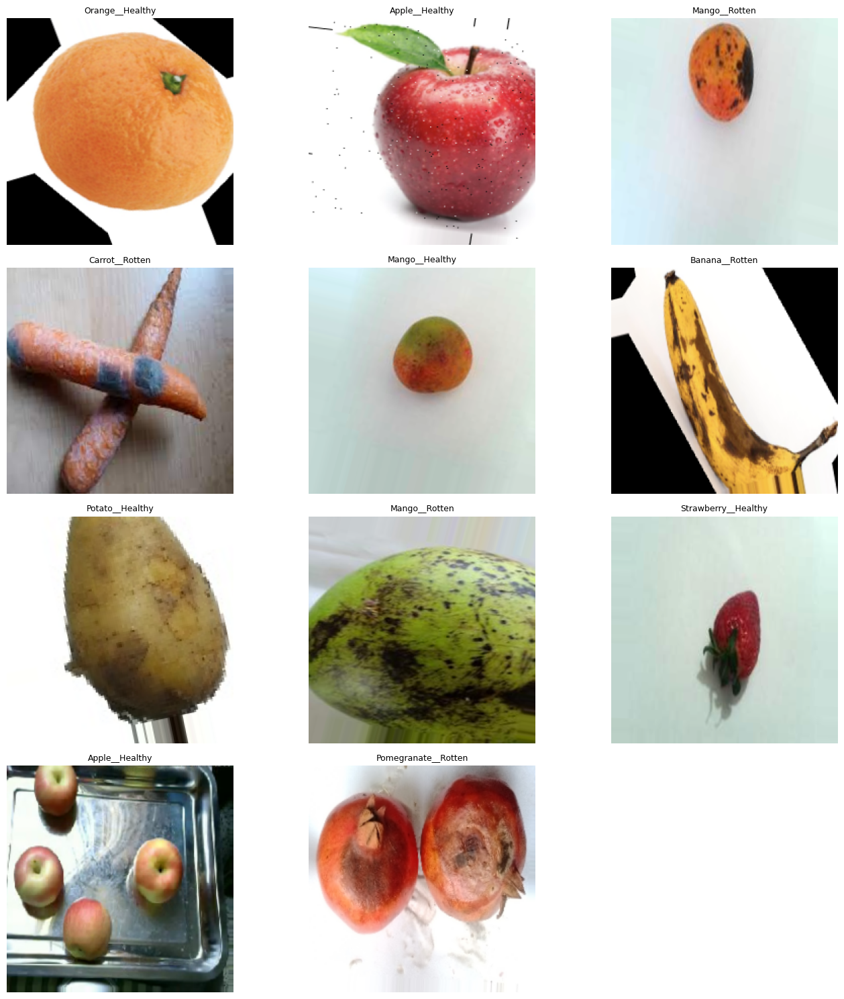

In [ ]:
plot_data(_train_base, 12)

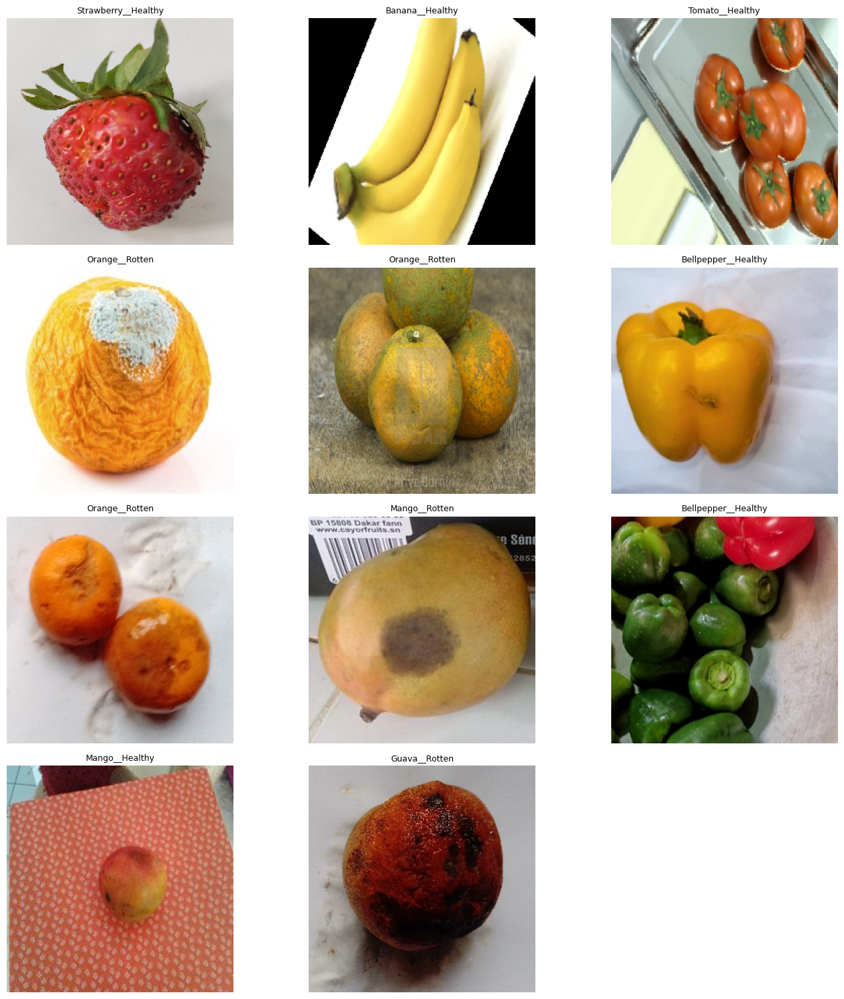

In [ ]:
plot_data(_val_base, 12)

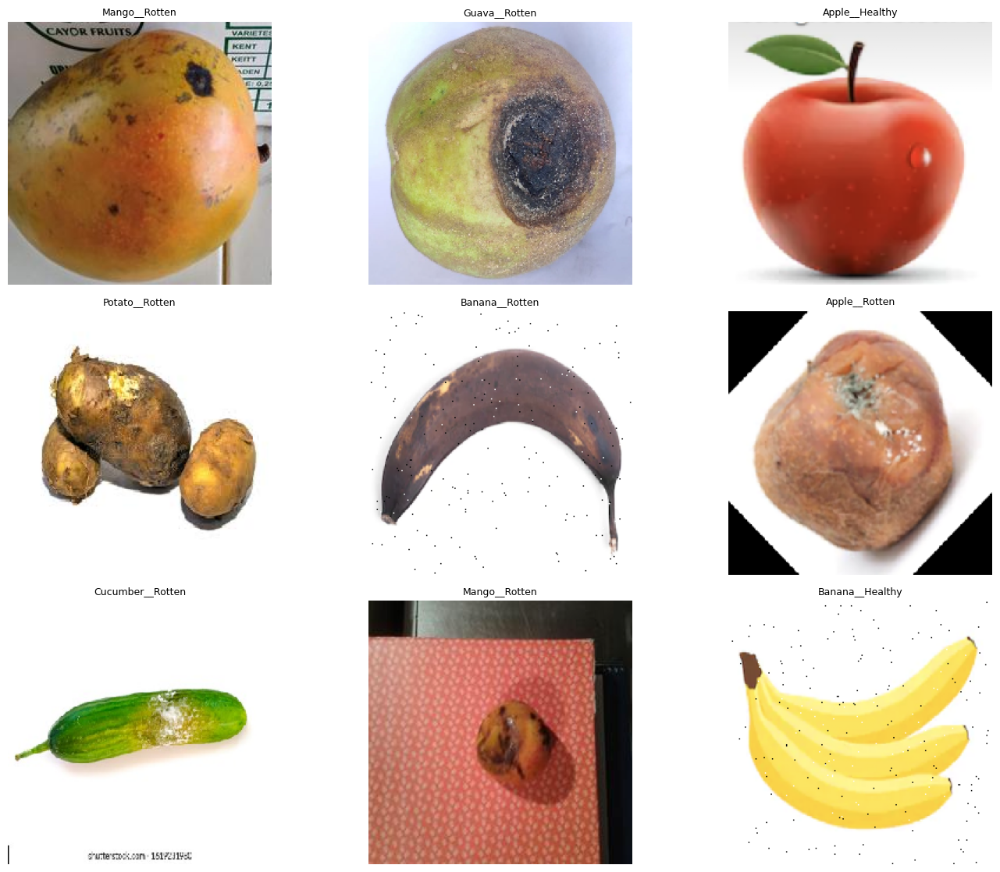

In [ ]:
if INCLUDE_TEST:
    plot_data(_test_base, 10)

# MODELO Multi-Output con Transfer Learning (EfficientNetB0)

## ¿Por qué este diseño?

En el notebook de gatos y perros concluimos que la CNN custom funcionó razonablemente pero
que **transfer learning** era el siguiente paso natural. Aquí lo aplicamos desde el inicio.

---

## Arquitectura

```
Input (224x224x3)
       ↓
EfficientNetB0 (base preentrenada en ImageNet, congelada inicialmente)
       ↓
GlobalAveragePooling2D
       ↓
Dense(256, relu) → BatchNormalization → Dropout(0.4)
      ↙                                        ↘
[fruit_output]                          [state_output]
Dense(128, relu)                        Dense(64, relu)
Dense(N_FRUITS, softmax)                Dense(2, softmax)
```

---

## ¿Por qué una sola red con dos cabezas en lugar de dos modelos?

- Las capas convolucionales aprenden features visuales compartidas (manchas, colores, texturas)
  que son útiles **tanto** para identificar la fruta **como** su estado.
- Una sola inferencia → dos predicciones simultáneas → ideal para cámara en tiempo real.
- Menor consumo de memoria y latencia respecto a dos modelos separados.

---

## Estrategia de entrenamiento en dos fases

| Fase | Base EfficientNet | Cabezas | Épocas |
|------|-------------------|---------|--------|
| 1    | Congelada         | Entrenando | 10   |
| 2    | Últimas 20 capas descongeladas | Todas | 10 |

In [ ]:
def build_multioutput_model(n_fruits, n_states, img_size=(224, 224)):
    """
    Construye el modelo multi-output con EfficientNetB0 como base.

    Parámetros:
    -----------
    n_fruits : int
        Número de tipos de fruta (clases de la cabeza 1).
    n_states : int
        Número de estados: 2 (Good / Bad) (clases de la cabeza 2).
    img_size : tuple
        Tamaño de entrada (alto, ancho). Por defecto 224x224.

    Retorna:
    --------
    model : tf.keras.Model
        Modelo multi-output listo para compilar.
    base_model : tf.keras.Model
        Referencia a EfficientNetB0 para descongelar en fase 2.

    Estructura:
    -----------
    Entrada → EfficientNetB0 (congelada) → GlobalAvgPool → Dense(256)+BN+Dropout
           ↘ fruit_output: Dense(128) → Dense(n_fruits, softmax)
           ↘ state_output: Dense(64)  → Dense(n_states, softmax)
    """
    # ── Entrada ──────────────────────────────────────────────────────────────
    inputs = Input(shape=(*img_size, 3))

    # ── Base preentrenada (Transfer Learning) ────────────────────────────────
    # include_top=False → eliminamos la cabeza de clasificación original de ImageNet
    # weights='imagenet'  → cargamos los pesos preentrenados
    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_tensor=inputs
    )
    base_model.trainable = False   # Fase 1: base congelada

    # ── Cuello compartido ────────────────────────────────────────────────────
    # GlobalAveragePooling2D en lugar de Flatten: menos parámetros, mejor generalización
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)            # Regularización: evita overfitting

    # ── Cabeza 1: Tipo de fruta ───────────────────────────────────────────────
    fruit_branch = Dense(128, activation='relu')(x)
    fruit_output = Dense(n_fruits, activation='softmax', name='fruit_output')(fruit_branch)

    # ── Cabeza 2: Estado (sana / podrida) ────────────────────────────────────
    state_branch = Dense(64, activation='relu')(x)
    state_output = Dense(n_states, activation='softmax', name='state_output')(state_branch)

    # ── Modelo final ─────────────────────────────────────────────────────────
    model = Model(inputs=inputs, outputs=[fruit_output, state_output])

    return model, base_model


model, base_model = build_multioutput_model(N_FRUITS, N_STATES)
model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,429,811 (16.90 MB)

 Trainable params: 379,728 (1.45 MB)

 Non-trainable params: 4,050,083 (15.45 MB)

In [ ]:
# ─── FASE 1: Entrenamiento con base congelada ─────────────────────────────
# Igual que en el notebook de gatos y perros usamos Adam,
# pero con learning_rate más bajo por ser transfer learning.

model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss={
        'fruit_output': 'categorical_crossentropy',
        'state_output': 'categorical_crossentropy'
    },
    loss_weights={
        'fruit_output': 1.0,   # Clasificar fruta tiene igual peso
        'state_output': 1.0    # que detectar si está podrida
    },
    metrics={
        'fruit_output': ['accuracy'],
        'state_output': ['accuracy']
    }
)

print("Modelo compilado — Fase 1 (base congelada)")

Modelo compilado — Fase 1 (base congelada)


### importante: más épocas mejoran el modelo pero elevan el consumo computacional
(igual que en el notebook de gatos y perros)

In [ ]:
# ─── Callbacks ────────────────────────────────────────────────────────────
# EarlyStopping: detiene si val_loss no mejora en 5 épocas
early_stop = EarlyStopping(
    monitor='val_loss', patience=5, restore_best_weights=True, verbose=1
)

# ReduceLROnPlateau: reduce el lr si el modelo se estanca
# (análogo al LearningRateScheduler del nb original)
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1
)

STEPS_PER_EPOCH  = _train_base.samples // BATCH_SIZE
VALIDATION_STEPS = _val_base.samples   // BATCH_SIZE

print(f"Steps per epoch  : {STEPS_PER_EPOCH}")
print(f"Validation steps : {VALIDATION_STEPS}")

# ─── Entrenamiento Fase 1 ─────────────────────────────────────────────────
r_phase1 = model.fit(
    train_generator,
    steps_per_epoch=STEPS_PER_EPOCH,
    epochs=10,                          # Fase 1: 10 épocas con base congelada
    validation_data=validation_generator,
    validation_steps=VALIDATION_STEPS,
    callbacks=[early_stop, reduce_lr]
)

Steps per epoch  : 640
Validation steps : 136
Epoch 1/10
439/640 ━━━━━━━━━━━━━━━━━━━━ 1:58 591ms/step - fruit_output_accuracy: 0.8053 - fruit_output_loss: 0.6318 - loss: 0.9817 - state_output_accuracy: 0.8635 - state_output_loss: 0.3499

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



640/640 ━━━━━━━━━━━━━━━━━━━━ 487s 711ms/step - fruit_output_accuracy: 0.9078 - fruit_output_loss: 0.2940 - loss: 0.4936 - state_output_accuracy: 0.9212 - state_output_loss: 0.1990 - val_fruit_output_accuracy: 0.9720 - val_fruit_output_loss: 0.0812 - val_loss: 0.2062 - val_state_output_accuracy: 0.9527 - val_state_output_loss: 0.1250 - learning_rate: 0.0010
Epoch 2/10
640/640 ━━━━━━━━━━━━━━━━━━━━ 399s 624ms/step - fruit_output_accuracy: 0.9585 - fruit_output_loss: 0.1235 - loss: 0.2346 - state_output_accuracy: 0.9574 - state_output_loss: 0.1111 - val_fruit_output_accuracy: 0.9784 - val_fruit_output_loss: 0.0650 - val_loss: 0.1380 - val_state_output_accuracy: 0.9717 - val_state_output_loss: 0.0730 - learning_rate: 0.0010
Epoch 3/10
640/640 ━━━━━━━━━━━━━━━━━━━━ 389s 609ms/step - fruit_output_accuracy: 0.9678 - fruit_output_loss: 0.0943 - loss: 0.1842 - state_output_accuracy: 0.9664 - state_output_loss: 0.0904 - val_fruit_output_accuracy: 0.9816 - val_fruit_output_loss: 0.0556 - val_loss: 

In [ ]:
# ─── FASE 2: Fine-tuning — descongelar las últimas 20 capas de EfficientNetB0 ──
# Permite que la base se adapte a las texturas específicas de frutas.

base_model.trainable = True

# Congelar todo excepto las últimas 20 capas
for layer in base_model.layers[:-20]:
    layer.trainable = False

# Recompilar con learning_rate mucho más bajo para no destruir los pesos aprendidos
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss={'fruit_output': 'categorical_crossentropy', 'state_output': 'categorical_crossentropy'},
    loss_weights={'fruit_output': 1.0, 'state_output': 1.0},
    metrics={'fruit_output': ['accuracy'], 'state_output': ['accuracy']}
)

print("Modelo recompilado — Fase 2 (fine-tuning últimas 20 capas)")
print(f"Capas entrenables: {sum(1 for l in model.layers if l.trainable)}")

r_phase2 = model.fit(
    train_generator,
    steps_per_epoch=STEPS_PER_EPOCH,
    epochs=10,                          # Fase 2: otras 10 épocas de fine-tuning
    validation_data=validation_generator,
    validation_steps=VALIDATION_STEPS,
    callbacks=[early_stop, reduce_lr]
)

Modelo recompilado — Fase 2 (fine-tuning últimas 20 capas)
Capas entrenables: 28
Epoch 1/10
640/640 ━━━━━━━━━━━━━━━━━━━━ 433s 632ms/step - fruit_output_accuracy: 0.9358 - fruit_output_loss: 0.2047 - loss: 0.3310 - state_output_accuracy: 0.9539 - state_output_loss: 0.1287 - val_fruit_output_accuracy: 0.9747 - val_fruit_output_loss: 0.0923 - val_loss: 0.1501 - val_state_output_accuracy: 0.9798 - val_state_output_loss: 0.0578 - learning_rate: 1.0000e-05
Epoch 2/10
640/640 ━━━━━━━━━━━━━━━━━━━━ 381s 597ms/step - fruit_output_accuracy: 0.9568 - fruit_output_loss: 0.1307 - loss: 0.2261 - state_output_accuracy: 0.9661 - state_output_loss: 0.0952 - val_fruit_output_accuracy: 0.9814 - val_fruit_output_loss: 0.0691 - val_loss: 0.1203 - val_state_output_accuracy: 0.9818 - val_state_output_loss: 0.0512 - learning_rate: 1.0000e-05
Epoch 3/10
640/640 ━━━━━━━━━━━━━━━━━━━━ 0s 538ms/step - fruit_output_accuracy: 0.9639 - fruit_output_loss: 0.1094 - loss: 0.1865 - state_output_accuracy: 0.9711 - state_ou

# Evaluation

## Evaluate the model on the test set

In [ ]:
# Evaluación en test — análogo a model.evaluate(test_generator) del nb original
if INCLUDE_TEST:
    TEST_STEPS = _test_base.samples // BATCH_SIZE
    results_eval = model.evaluate(
        test_generator,
        steps=TEST_STEPS
    )
    print("\nTest Results:")
    for name, val in zip(model.metrics_names, results_eval):
        print(f"  {name}: {val:.4f}")

137/137 ━━━━━━━━━━━━━━━━━━━━ 37s 271ms/step - fruit_output_accuracy: 0.9717 - fruit_output_loss: 0.0889 - loss: 0.1429 - state_output_accuracy: 0.9762 - state_output_loss: 0.0544

Test Results:
  loss: 0.1429
  compile_metrics: 0.0889
  fruit_output_loss: 0.0544
  state_output_loss: 0.9717


## Visualize the predictions

In [ ]:
def plot_prediction(base_gen, n_images):
    """
    Muestra imágenes con la predicción del modelo y la etiqueta real para ambas cabezas.
    Verde = predicción correcta, Rojo = predicción incorrecta.
    Análogo a plot_prediction del notebook de gatos y perros.

    Parámetros:
    -----------
    base_gen : DirectoryIterator
        Generador base (sin wrapper multi-output).
    n_images : int
        Número de imágenes a mostrar.
    """
    idx_to_folder = {v: k for k, v in base_gen.class_indices.items()}
    images, labels_onehot = next(base_gen)
    folder_indices = np.argmax(labels_onehot, axis=1)

    # Predicciones del modelo multi-output
    pred_fruit, pred_state = model.predict(images, verbose=0)
    pred_fruit_idx = np.argmax(pred_fruit, axis=1)
    pred_state_idx = np.argmax(pred_state, axis=1)

    plt.figure(figsize=(14, 15))
    for i, (image, folder_idx) in enumerate(zip(images, folder_indices)):
        if i + 1 == n_images:
            break

        folder_name = idx_to_folder[folder_idx]
        true_fruit, true_state = folder_name.rsplit('_', 1)

        pred_fruit_name = fruit_classes[pred_fruit_idx[i]]
        pred_state_name = state_classes[pred_state_idx[i]]

        fruit_ok = pred_fruit_name == true_fruit
        state_ok  = pred_state_name == true_state

        plt.subplot(4, 3, i + 1)
        # Normalize image to [0, 1] range for proper display
        display_image = (image - image.min()) / (image.max() - image.min()) if image.max() != image.min() else image
        plt.imshow(display_image)

        title = f"Real: {true_fruit} / {true_state}\nPred: {pred_fruit_name} / {pred_state_name}"
        color = 'green' if (fruit_ok and state_ok) else 'red'
        plt.title(title, fontsize=7, color=color)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

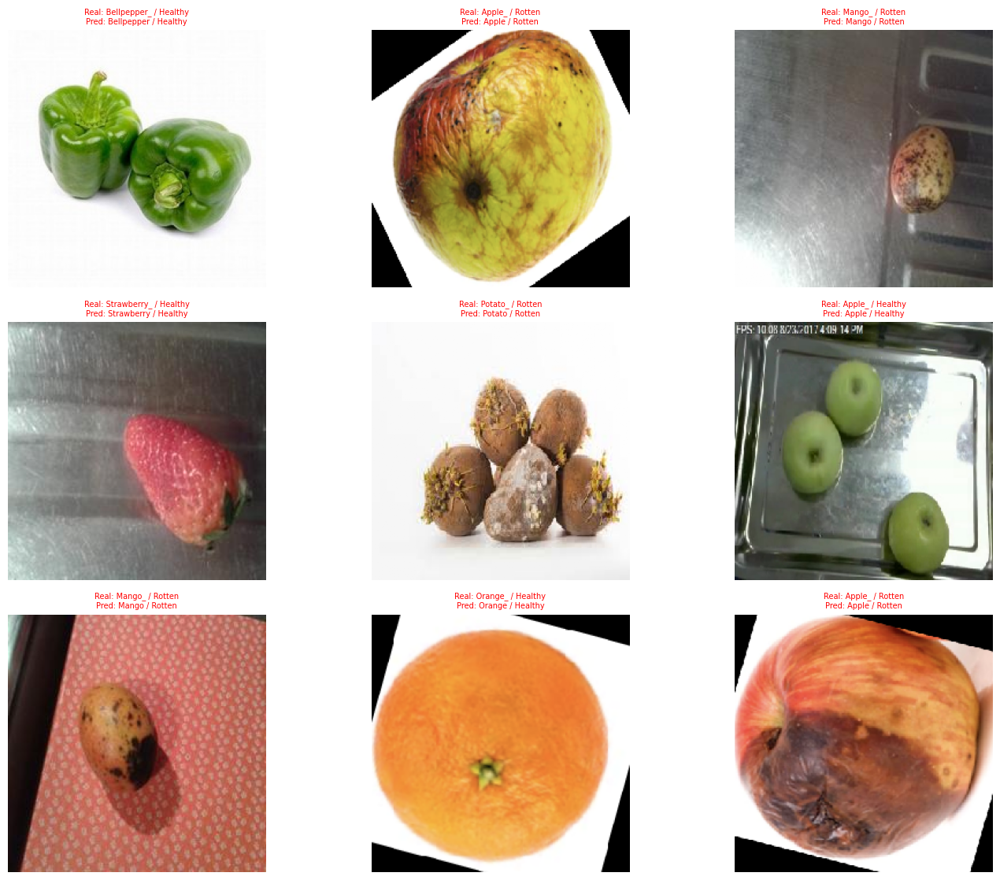

In [ ]:
if INCLUDE_TEST:
    plot_prediction(_test_base, 10)

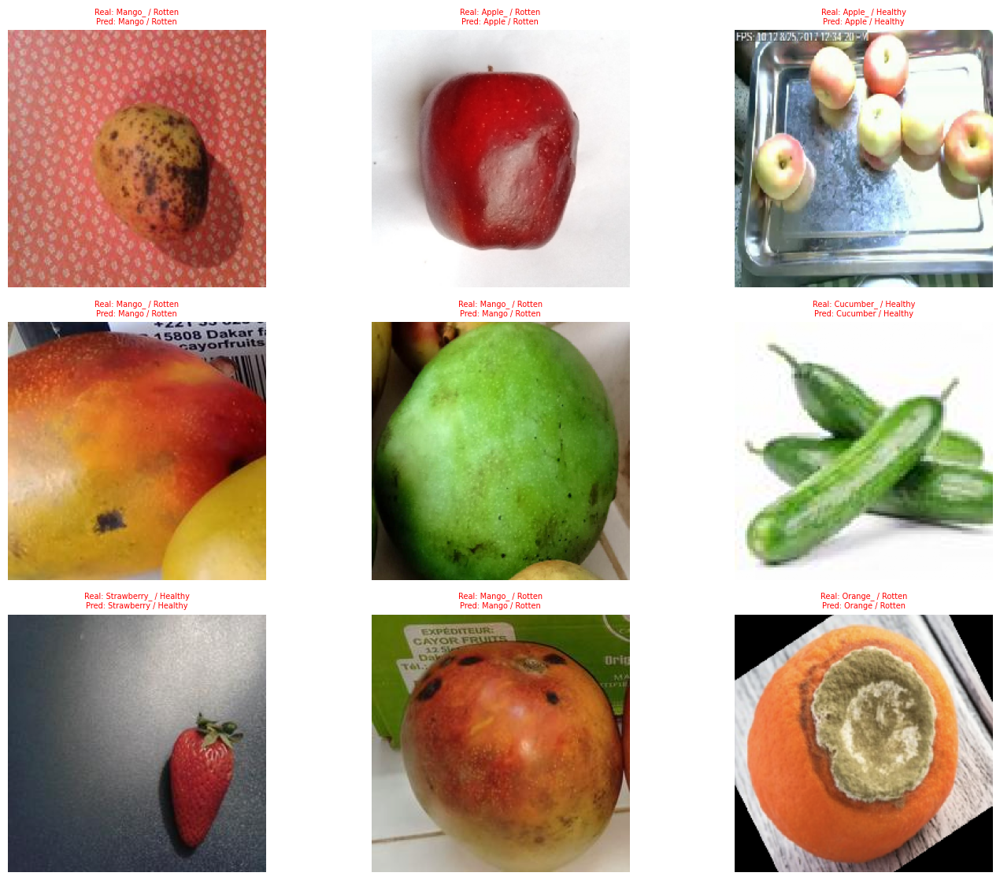

In [ ]:
plot_prediction(_val_base, 10)

# Visualize Class Activation Maps (CAM)

In [ ]:
import tensorflow as tf

# Encontrar la última capa convolucional de EfficientNetB0
last_conv_layer = next(
    l for l in reversed(base_model.layers) if isinstance(l, tf.keras.layers.Conv2D)
)
print("Última capa convolucional:", last_conv_layer.name)

# Modelo para Grad-CAM: entrada → activaciones conv + predicciones de ambas cabezas
activation_model = tf.keras.models.Model(
    inputs=model.inputs,
    outputs=[
        last_conv_layer.output, # Salida de la última capa convolucional
        model.get_layer('fruit_output').output, # Predicciones de fruta
        model.get_layer('state_output').output  # Predicciones de estado
    ]
)

Última capa convolucional: top_conv


In [ ]:
# Extraer activaciones sobre un batch de test
images_cam, _ = next(_test_base)
features_cam, results_fruit, results_state = activation_model.predict(images_cam, verbose=0)
print("Shape features conv:", features_cam.shape)
print("Shape pred fruta:", results_fruit.shape)
print("Shape pred estado:", results_state.shape)

Shape features conv: (32, 7, 7, 1280)
Shape pred fruta: (32, 14)
Shape pred estado: (32, 2)


In [ ]:
def make_gradcam_heatmap(img_array, grad_model, pred_index=None, target_output_idx=0):
    """
    Generates a Grad-CAM heatmap for a given image.

    Parameters:
    -----------
    img_array : np.ndarray
        The preprocessed image array (e.g., after EfficientNetB0 preprocessing).
    grad_model : tf.keras.Model
        A model that outputs (last_conv_layer_output, fruit_output_predictions, state_output_predictions).
    pred_index : int, optional
        The index of the class for which to generate the CAM. If None, the top predicted class is used.
    target_output_idx : int
        0 for fruit_output, 1 for state_output.

    Returns:
    --------
    np.ndarray
        The Grad-CAM heatmap.
    """
    with tf.GradientTape() as tape:
        last_conv_layer_output, fruit_preds, state_preds = grad_model(img_array)
        if target_output_idx == 0: # Fruit output
            if pred_index is None:
                pred_index = tf.argmax(fruit_preds[0])
            class_channel = fruit_preds[:, pred_index]
        else: # State output
            if pred_index is None:
                pred_index = tf.argmax(state_preds[0])
            class_channel = state_preds[:, pred_index]

    # Gradient of the predicted class with respect to the output of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Pool the gradients (Global Average Pooling)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel in the feature map by the importance of that channel
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # ReLU activation on the heatmap
    heatmap = tf.maximum(heatmap, 0)
    # Add epsilon for numerical stability in case of division by zero
    max_heatmap = tf.reduce_max(heatmap)
    if max_heatmap == 0:
        heatmap = heatmap
    else:
        heatmap = heatmap / (max_heatmap + tf.keras.backend.epsilon())

    return heatmap.numpy()


def show_cam(image_index, images_batch, grad_cam_model_local):
    """
    Visualiza los mapas Grad-CAM para una imagen, mostrando qué zonas activaron
    la predicción de tipo de fruta y estado.

    Parámetros:
    -----------
    image_index : int
        Índice de la imagen dentro del batch.
    images_batch : np.ndarray
        El batch de imágenes preprocesadas.
    grad_cam_model_local : tf.keras.Model
        El modelo Grad-CAM configurado para devolver feature maps y predicciones.
    """
    original_image = images_batch[image_index]
    image_for_model = np.expand_dims(original_image, axis=0) # Add batch dimension

    # Get predictions for titles
    _, fruit_preds, state_preds = grad_cam_model_local.predict(image_for_model, verbose=0)

    pred_fruit_idx = np.argmax(fruit_preds[0])
    pred_state_idx = np.argmax(state_preds[0])

    # Generate heatmaps for fruit and state
    heatmap_fruit = make_gradcam_heatmap(image_for_model, grad_cam_model_local, pred_index=pred_fruit_idx, target_output_idx=0)
    heatmap_state = make_gradcam_heatmap(image_for_model, grad_cam_model_local, pred_index=pred_state_idx, target_output_idx=1)

    # Upsample heatmaps to original image size
    heatmap_fruit = tf.image.resize(
        tf.expand_dims(heatmap_fruit, axis=2),
        (IMG_SIZE[0], IMG_SIZE[1]),
        method='nearest'
    ).numpy()
    heatmap_state = tf.image.resize(
        tf.expand_dims(heatmap_state, axis=2),
        (IMG_SIZE[0], IMG_SIZE[1]),
        method='nearest'
    ).numpy()

    # Convert original_image to displayable format (undo EfficientNet preprocessing if needed)
    # EfficientNet preprocessing scales input images to the range [-1, 1] or [0, 1].
    # For display, we want values in [0, 255] or [0, 1]. Assuming it's in a range suitable for direct imshow.
    display_image = (original_image - original_image.min()) / (original_image.max() - original_image.min()) if original_image.max() != original_image.min() else original_image


    plt.figure(figsize=(12, 6))

    # Fruit CAM
    plt.subplot(1, 2, 1)
    plt.imshow(display_image)
    plt.imshow(heatmap_fruit, cmap='jet', alpha=0.4)
    pred_fruit_name = fruit_classes[pred_fruit_idx]
    conf_fruit = fruit_preds[0][pred_fruit_idx]
    plt.title(f"Fruit: {pred_fruit_name} ({conf_fruit:.2%})", fontsize=10)
    plt.axis('off')

    # State CAM
    plt.subplot(1, 2, 2)
    plt.imshow(display_image)
    plt.imshow(heatmap_state, cmap='jet', alpha=0.4)
    pred_state_name = state_classes[pred_state_idx]
    conf_state = state_preds[0][pred_state_idx]
    plt.title(f"State: {pred_state_name} ({conf_state:.2%})", fontsize=10)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

Mostrando Grad-CAMs para: Apple


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 224, 224, 3))



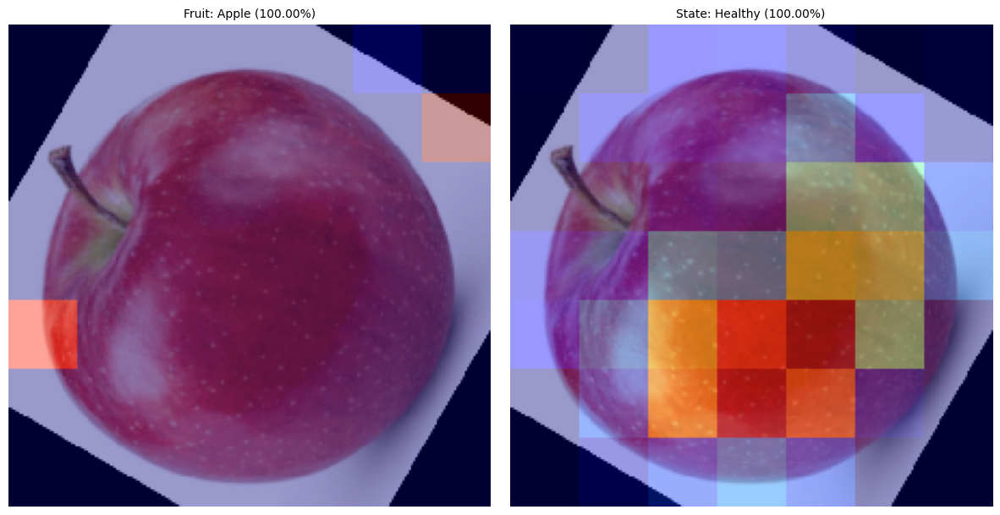

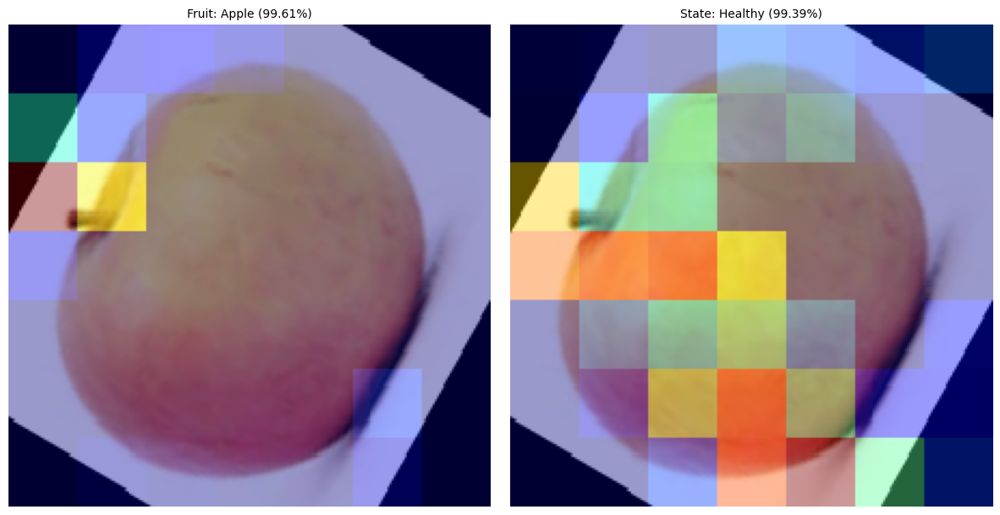

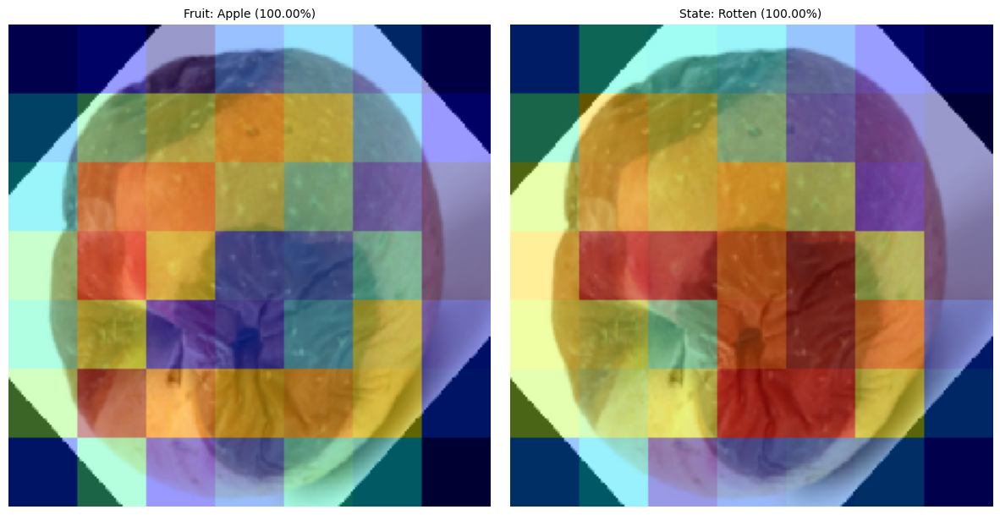

In [ ]:
def show_maps_grad_cam(desired_fruit_idx, num_maps, images_batch, grad_cam_model_local):
    """
    Muestra mapas Grad-CAM para imágenes clasificadas como una fruta específica.
    """
    counter = 0
    # Get predictions from the full model for filtering
    _, fruit_preds_batch, _ = grad_cam_model_local.predict(images_batch, verbose=0)

    for i in range(images_batch.shape[0]): # Iterate through the batch size of images_cam
        if counter >= num_maps:
            break
        predicted_fruit_idx = np.argmax(fruit_preds_batch[i])
        if predicted_fruit_idx == desired_fruit_idx:
            counter += 1
            show_cam(i, images_batch, grad_cam_model_local)


# Ejemplo: CAMs para la primera fruta de la lista
print(f"Mostrando Grad-CAMs para: {fruit_classes[0]}")
show_maps_grad_cam(desired_fruit_idx=0, num_maps=3, images_batch=images_cam, grad_cam_model_local=activation_model)

Mostrando Grad-CAMs para: Banana


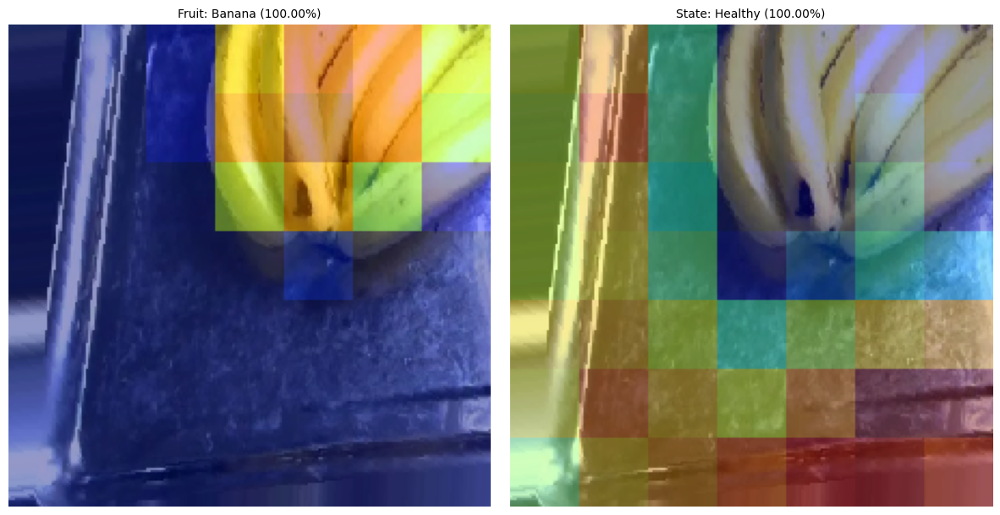

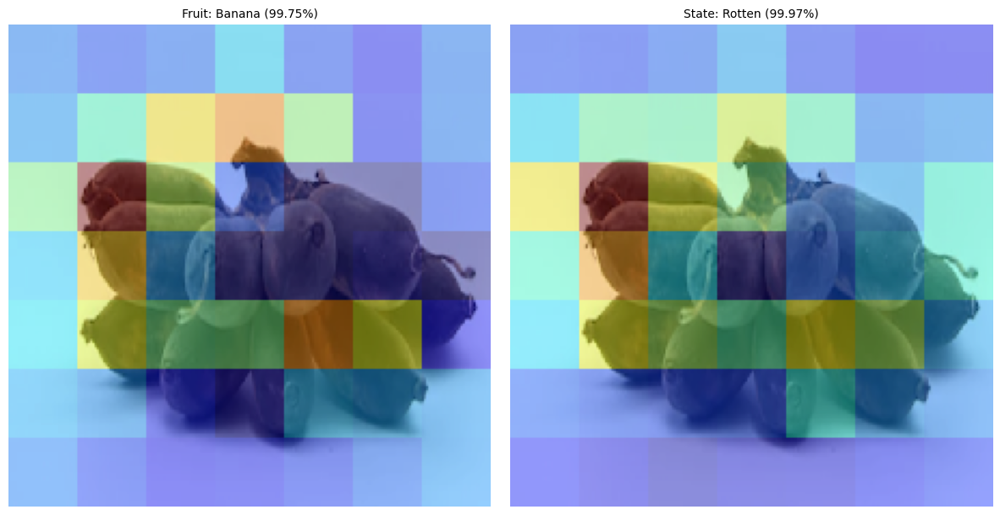

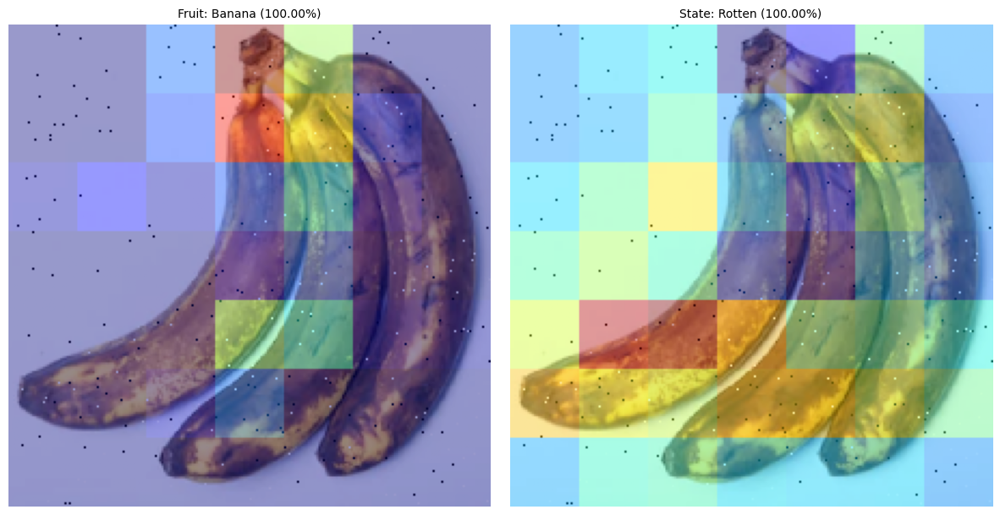

In [ ]:
# CAMs para la segunda fruta
print(f"Mostrando Grad-CAMs para: {fruit_classes[1]}")
show_maps_grad_cam(desired_fruit_idx=1, num_maps=3, images_batch=images_cam, grad_cam_model_local=activation_model)

## Visualize training process

In [ ]:
# Combinar historial de las dos fases de entrenamiento
# (igual que pd.DataFrame(r.history) en el nb original)
hist1 = pd.DataFrame(r_phase1.history)
hist2 = pd.DataFrame(r_phase2.history)
hist2.index = hist2.index + len(hist1)   # desplazar índice de épocas
results = pd.concat([hist1, hist2])

# Añadir columna de fase para visualización
results['phase'] = (['Fase 1 (base congelada)'] * len(hist1) +
                    ['Fase 2 (fine-tuning)']    * len(hist2))
results.tail()

In [ ]:
# ─── Accuracy de fruta ────────────────────────────────────────────────────
fig = px.line(
    results,
    y=['fruit_output_accuracy', 'val_fruit_output_accuracy'],
    template='seaborn',
    color_discrete_sequence=['#fad25a', 'red'],
    title='Accuracy — Clasificación de Fruta'
)
fig.update_layout(
    title_font_color='#fad25a',
    xaxis=dict(color='#fad25a', title='Epochs'),
    yaxis=dict(color='#fad25a')
)
fig.show()

In [ ]:
# ─── Accuracy de estado (sana/podrida) ───────────────────────────────────
fig = px.line(
    results,
    y=['state_output_accuracy', 'val_state_output_accuracy'],
    template='seaborn',
    color_discrete_sequence=['#fad25a', 'red'],
    title='Accuracy — Estado (Sana / Podrida)'
)
fig.update_layout(
    title_font_color='#fad25a',
    xaxis=dict(color='#fad25a', title='Epochs'),
    yaxis=dict(color='#fad25a')
)
fig.show()

In [ ]:
# ─── Loss total ───────────────────────────────────────────────────────────
fig = px.line(
    results,
    y=['loss', 'val_loss'],
    template='seaborn',
    color_discrete_sequence=['#fad25a', 'red'],
    title='Loss Total (fruit + state)'
)
fig.update_layout(
    title_font_color='#fad25a',
    xaxis=dict(color='#fad25a', title='Epochs'),
    yaxis=dict(color='#fad25a')
)
fig.show()

# Guardar el modelo

In [ ]:
# Guardar en formato Keras (recomendado para deploy con FastAPI)
model.save('fruit_multioutput_model.keras')
print("Modelo guardado en: fruit_multioutput_model.keras")

# Guardar también los mapeos de clases para usarlos en el backend
import json

class_config = {
    'fruit_classes': fruit_classes,
    'state_classes': state_classes,
    'img_size': list(IMG_SIZE)
}

with open('class_config.json', 'w') as f:
    json.dump(class_config, f, indent=2)

print("Configuración guardada en: class_config.json")
print(json.dumps(class_config, indent=2))

Modelo guardado en: fruit_multioutput_model.keras
Configuración guardada en: class_config.json
{
  "fruit_classes": [
    "Apple",
    "Banana",
    "Bellpepper",
    "Carrot",
    "Cucumber",
    "Grape",
    "Guava",
    "Jujube",
    "Mango",
    "Orange",
    "Pomegranate",
    "Potato",
    "Strawberry",
    "Tomato"
  ],
  "state_classes": [
    "Healthy",
    "Rotten"
  ],
  "img_size": [
    224,
    224
  ]
}


# Trying Data Augmentation (Comparación)

## ¿Qué es la Aumentación de Datos?

La **data augmentation** crea versiones modificadas de las imágenes para que el modelo **generalice mejor**.
Ya la incluimos en el entrenamiento principal, pero aquí comparamos hiperparámetros más agresivos.

---

## Técnicas adicionales para frutas

- `rotation_range=40` — rotaciones más pronunciadas (frutas pueden estar en cualquier orientación)
- `zoom_range=0.3` — zoom aleatorio
- `vertical_flip=True` — volteos verticales también
- `brightness_range=[0.7, 1.3]` — variaciones de iluminación (clave para detectar color de podredumbre)
- `shear_range=0.2` — deformaciones de perspectiva

```python
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen_aug = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.7, 1.3],
    shear_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2
)
```

In [ ]:
train_gen_aug = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.7, 1.3],
    shear_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    fill_mode='nearest'
)

validation_gen_aug = ImageDataGenerator(rescale=1./255)

_train_base_aug = train_gen_aug.flow_from_directory(
    TRAINING_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

_val_base_aug = validation_gen_aug.flow_from_directory(
    VALIDATION_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

train_generator_aug = multioutput_generator(
    _train_base_aug, folder_to_fruit_idx, folder_to_state_idx, N_FRUITS, N_STATES
)
validation_generator_aug = multioutput_generator(
    _val_base_aug, folder_to_fruit_idx, folder_to_state_idx, N_FRUITS, N_STATES
)

In [ ]:
# Nuevo modelo con misma arquitectura para comparar con augmentation agresiva
model_aug, base_model_aug = build_multioutput_model(N_FRUITS, N_STATES)

model_aug.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss={'fruit_output': 'categorical_crossentropy', 'state_output': 'categorical_crossentropy'},
    loss_weights={'fruit_output': 1.0, 'state_output': 1.0},
    metrics={'fruit_output': ['accuracy'], 'state_output': ['accuracy']}
)

r_aug = model_aug.fit(
    train_generator_aug,
    steps_per_epoch=STEPS_PER_EPOCH,
    epochs=10,        # Entrenar más épocas puede mejorar los resultados
    validation_data=validation_generator_aug,
    validation_steps=VALIDATION_STEPS,
    callbacks=[early_stop, reduce_lr]
)

In [ ]:
results_aug = pd.DataFrame(r_aug.history)
results_aug.tail()

In [ ]:
fig = px.line(
    results_aug,
    y=['fruit_output_accuracy', 'val_fruit_output_accuracy'],
    template='seaborn',
    color_discrete_sequence=['#fad25a', 'red'],
    title='Accuracy Fruta — Augmentation Agresiva'
)
fig.update_layout(
    title_font_color='#fad25a',
    xaxis=dict(color='#fad25a', title='Epochs'),
    yaxis=dict(color='#fad25a')
)
fig.show()

In [ ]:
fig = px.line(
    results_aug,
    y=['loss', 'val_loss'],
    template='seaborn',
    color_discrete_sequence=['#fad25a', 'red'],
    title='Loss Total — Augmentation Agresiva'
)
fig.update_layout(
    title_font_color='#fad25a',
    xaxis=dict(color='#fad25a', title='Epochs'),
    yaxis=dict(color='#fad25a')
)
fig.show()

## Conclusiones

- El modelo **multi-output con EfficientNetB0** clasifica simultáneamente el **tipo de fruta** y su **estado (sana/podrida)** en una sola inferencia.
- El entrenamiento en **dos fases** (base congelada → fine-tuning) es clave: la fase 1 adapta las cabezas al dominio de frutas; la fase 2 refina las features de bajo nivel.
- La augmentation moderada (fase 1) suele dar mejores resultados que la agresiva — consistente con las conclusiones del notebook de gatos y perros.
- **Próximos pasos:**
  - Backend FastAPI con login y logs en BD.
  - Frontend con cámara en tiempo real y subida de imágenes.
  - El modelo guardado (`fruit_multioutput_model.keras`) y `class_config.json` son los artefactos para el deploy.

In [ ]:
# ── 1. Ver carpetas reales ──────────────────────────────────────────
print("TRAIN carpetas:", sorted(os.listdir(TRAINING_DIR))[:6])
print("VAL   carpetas:", sorted(os.listdir(VALIDATION_DIR))[:6])

# ── 2. Ver el mapeo de estado ───────────────────────────────────────
print("\nstate2idx:", state2idx)
print("folder_to_state_idx:", folder_to_state_idx)

# ── 3. Inspeccionar un batch de validación ──────────────────────────
sample_x, sample_y = next(validation_generator)
estados = sample_y['state_output']
print("\ny_state val (10 primeras filas):")
print(estados[:10])
print("Índices argmax:", np.argmax(estados[:10], axis=1))
print("¿Todas iguales?:", np.all(estados == estados[0]))

# ── 4. Ver class_indices del generador base ─────────────────────────
print("\nclass_indices train:", _train_base.class_indices)
print("class_indices val  :", _val_base.class_indices)